<a href="https://colab.research.google.com/github/lucieyang1/Summer-2023-ROP/blob/main/ROP_Main_Code_(Summary).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Loading & Preprocessing

In [ ]:
from google.colab import drive
drive.mount("/content/gdrive", force_remount=True)

Mounted at /content/gdrive


In [ ]:
!cp '/content/gdrive/MyDrive/Colab Notebooks/IRMA/irma_dataset_new.py' /content

In [ ]:
from irma_dataset_new import Irma


irma = Irma("/content/gdrive/MyDrive/Colab Notebooks/IRMA/irma-xray-dataset")
irma.load()

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

In [ ]:
from sklearn import metrics
from torchvision import transforms
from torch.utils.data import DataLoader
from torch.utils.data.dataset import Dataset
import cv2
import os
import torchvision
import torch
from torch import nn
import torch.nn.functional as F
import torchvision.models as models
from torchsummary import summary
import torch.optim as optim
from PIL import Image
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.model_selection import KFold
from sklearn.metrics import pairwise_distances, silhouette_score, davies_bouldin_score, classification_report, roc_auc_score
import pickle
import time
from math import sqrt
import random

In [ ]:
random_seed = 299
random.seed(random_seed)
np.random.seed(random_seed)
torch.manual_seed(random_seed)

# General Functions

## Binary CNN Functions (ResNet-18)

In [ ]:
class XRayDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transforms.Compose([
            transforms.Resize((512, 512)),  # Resize images to a consistent size
            transforms.ToTensor()
        ])

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, index):
        row = self.dataframe.iloc[index]
        image = self.load_image(row['Path'])
        label = row['Binary Label']

        if self.transform:
            image = self.transform(image)

        return image, label

    def load_image(self, path):
        return Image.open(path).convert("RGB")

In [ ]:
def get_resnet18_binary_classifier(num_classes=2):
  # Load the pre-trained ResNet-18 model
  model = models.resnet18(pretrained=True)

  # Modify the last fully connected layer for binary classification
  num_ftrs = model.fc.in_features
  model.fc = nn.Linear(num_ftrs, 2)  # 2 output classes for binary classification

  return model

In [ ]:
def train_model(model, train_loader, val_loader, criterion, optimizer, device, num_epochs=100, patience=10):
    model.to(device)
    model.train()

    best_val_loss = np.inf
    early_stopping_counter = 0
    best_model_weights = None
    total_conv_time = 0.0
    epoch_times = []

    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss = 0.0
        train_correct = 0

        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs.data, 1)
            train_correct += (predicted == labels).sum().item()

        train_loss = train_loss / len(train_loader.dataset)
        train_accuracy = 100.0 * train_correct / len(train_loader.dataset)

        # Evaluate on the validation set
        model.eval()
        val_loss = 0.0
        val_correct = 0

        with torch.no_grad():
            for images, labels in val_loader:
                images = images.to(device)
                labels = labels.to(device)

                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                _, predicted = torch.max(outputs.data, 1)
                val_correct += (predicted == labels).sum().item()

            val_loss = val_loss / len(val_loader.dataset)
            val_accuracy = 100.0 * val_correct / len(val_loader.dataset)

        end_time = time.time()
        epoch_time = end_time - start_time
        total_conv_time += epoch_time
        epoch_times.append(epoch_time)

        print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, "
              f"Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%, Epoch Time: {epoch_time:.2f} seconds")

        # early stopping
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_weights = model.state_dict()
            early_stopping_counter = 0
        else:
            early_stopping_counter += 1

        if early_stopping_counter >= patience:
            print("Early stopping triggered. Training stopped.")
            break

    average_epoch_time = total_conv_time / len(epoch_times)
    print(f"Average training time per epoch: {average_epoch_time:.2f} seconds")

    # model.load_state_dict(best_model_weights)

    return model, average_epoch_time

In [ ]:
def train_and_save_models(dataframe, seed=299, num_splits=4, batch_size=16, model_prefix='model'):
    kf = KFold(n_splits=num_splits)
    fold = 1
    np.random.seed(seed)

    for train_index, val_index in kf.split(XRayDataset(dataframe)):
        print(f"Training fold {fold}")

        train_loader_fold = DataLoader(XRayDataset(dataframe.iloc[train_index]), batch_size=batch_size, shuffle=True)
        val_loader_fold = DataLoader(XRayDataset(dataframe.iloc[val_index]), batch_size=batch_size, shuffle=False)

        model = get_resnet18_binary_classifier(num_classes=2)

        criterion = nn.CrossEntropyLoss()
        optimizer = optim.Adam(model.parameters(), lr=0.001)
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        model = model.to(device)

        trained_model, average_epoch_time = train_model(model, train_loader_fold, val_loader_fold, criterion, optimizer, device)

        # Save the model to a file
        model_filename = f'/content/gdrive/MyDrive/Colab Notebooks/{model_prefix}_fold_{fold}.pt'
        torch.save(trained_model.state_dict(), model_filename)
        print(f"Model for fold {fold} saved as {model_filename}")

        fold += 1

    print("Cross-validation and model saving complete.")

In [ ]:
def evaluate_model(model, test_loader, criterion, device):
    model.eval()
    test_loss = 0.0
    test_correct = 0
    all_predictions = []
    all_labels = []
    total_inference_time = 0.0
    total_images = 0
    true_positives = 0
    true_negatives = 0
    false_positives = 0
    false_negatives = 0

    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            total_images += images.size(0)

            start_time = time.time()
            outputs = model(images)
            end_time = time.time()

            inference_time = end_time - start_time
            total_inference_time += inference_time

            loss = criterion(outputs, labels)

            test_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs.data, 1)
            test_correct += (predicted == labels).sum().item()

            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

            true_positives += ((predicted == 1) & (labels == 1)).sum().item()
            true_negatives += ((predicted == 0) & (labels == 0)).sum().item()
            false_positives += ((predicted == 1) & (labels == 0)).sum().item()
            false_negatives += ((predicted == 0) & (labels == 1)).sum().item()

    test_loss = test_loss / len(test_loader.dataset)
    test_accuracy = 100.0 * test_correct / len(test_loader.dataset)
    average_inference_time_per_image = total_inference_time / total_images

    print(f"Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.2f}%")
    print(f"Average Inference Time per Image: {average_inference_time_per_image:.6f} seconds")

    # Calculate sensitivity and specificity
    sensitivity = true_positives / (true_positives + false_negatives)
    specificity = true_negatives / (true_negatives + false_positives)
    print(f"Sensitivity: {sensitivity:.4f}")
    print(f"Specificity: {specificity:.4f}")

    auc_score = roc_auc_score(all_labels, all_predictions)
    print(f"AUC Score: {auc_score:.4f}")

    return test_loss, test_accuracy, auc_score, average_inference_time_per_image, sensitivity, specificity

In [ ]:
def preprocess_image(image_path, target_size):
    image = Image.open(image_path).convert("RGB")
    image = image.resize(target_size)
    image = transforms.ToTensor()(image)
    image = image.unsqueeze(0)  # Add batch dimension

    return image

def get_prediction(model, image_path):
    target_size = (512, 512)  # Adjust this size based on your model's input requirements
    image = preprocess_image(image_path, target_size).to(device)

    # Set the model to evaluation mode
    model.eval()

    # Make the prediction
    with torch.no_grad():
        output = model(image)

    # Get the predicted class (assuming your model's output is a tensor of probabilities)
    _, predicted_class = torch.max(output, 1)

    # Assuming you have a list of classes corresponding to the model's outputs
    classes = ['extremity', 'central']

    # Get the predicted label based on the predicted class index
    predicted_label = classes[predicted_class.item()]

    return predicted_label

## Clustering Functions

In [ ]:
def extract_features(feature_extractor, dataset, device):
    start_time = time.time()

    # Set the model to evaluation mode
    feature_extractor.eval()

    # Create an empty list to store the extracted features
    all_features = []

    # New DataLoader that does not shuffle!!
    dataloader_new = DataLoader(dataset, batch_size=16, shuffle=False)

    # Loop through the data
    with torch.no_grad():
        for images, _ in dataloader_new:
            images = images.to(device)
            # Pass the data through the model to get the features
            extracted_features = feature_extractor(images)
            all_features.append(extracted_features)

    # Concatenate the extracted features into a single tensor
    features = torch.cat(all_features, dim=0)

    end_time = time.time()
    elapsed_time = end_time - start_time

    print(f"Feature extraction took {elapsed_time:.4f} seconds.")

    # Convert tensor to numpy array
    features_np = features.cpu().numpy()

    # Flatten the array to a 2-dimensional array
    features_flat = features_np.reshape(features_np.shape[0], -1)

    return features_flat

In [ ]:
def cluster_and_get_labels(extracted_features, val_set, n_clusters=4, random_state=299, n_components=10):
    X_std = StandardScaler().fit_transform(extracted_features)
    pca = PCA(n_components=n_components)
    principalComponents = pca.fit_transform(X_std)

    kmeans = KMeans(n_clusters=n_clusters, random_state=random_state)
    cluster_labels = kmeans.fit_predict(principalComponents)

    return kmeans, principalComponents, cluster_labels

In [ ]:
def train_accuracy_cluster(cluster_indices, dataset):
  true_labels = []
  predictions = []
  # Load and preprocess images for the cluster
  for index in cluster_indices:
      image_path = dataset['Path'][index]
      label = dataset['Central or Extremity'][index]
      true_labels.append(label)
      prediction = get_prediction(model, image_path)
      predictions.append(prediction)

  # Calculate accuracy
  correct_predictions = 0

  for pred, true_label in zip(predictions, true_labels):
      if pred == true_label:
          correct_predictions += 1
  accuracy = correct_predictions / len(cluster_indices)

  print(f"Accuracy on the cluster: {accuracy:.4f}")
  return accuracy

In [ ]:
def coefficient_of_variation(cluster_accuracies):
  # Calculate the mean and standard deviation of the accuracy values
  mean_accuracy = np.mean(cluster_accuracies)
  std_deviation = np.std(cluster_accuracies, ddof=1)  # Use ddof=1 for sample standard deviation

  # Calculate the coefficient of variation
  coefficient_of_variation = (std_deviation / mean_accuracy) * 100

  print(f"Mean Accuracy: {mean_accuracy:.4f}")
  print(f"Standard Deviation: {std_deviation:.4f}")
  print(f"Coefficient of Variation: {coefficient_of_variation:.4f}")

In [ ]:
def analyze_clusters(principalComponents, cluster_labels, kmeans):
    silhouette_avg = silhouette_score(principalComponents, cluster_labels)
    print(f"Silhouette Score: {silhouette_avg:.4f}")

    # Calculate cluster centroids
    cluster_centers = kmeans.cluster_centers_

    # Calculate inter-cluster distance (average distance between cluster centroids)
    inter_cluster_distance = pairwise_distances(cluster_centers, metric='euclidean').mean()

    # Calculate intra-cluster distances (average distance of data points to their cluster centroid)
    intra_cluster_distances = []
    for cluster_id in range(len(cluster_centers)):
        cluster_data = principalComponents[cluster_labels == cluster_id]
        cluster_centroid = cluster_centers[cluster_id]
        distance = np.sqrt(((cluster_data - cluster_centroid) ** 2).sum(axis=1)).mean()
        intra_cluster_distances.append(distance)

    average_intra_cluster_distance = np.mean(intra_cluster_distances)

    print("Average Inter-Cluster Distance:", np.round(inter_cluster_distance, 2))
    print("Intra-Cluster Distances:", np.round(intra_cluster_distances, 2))
    print("Average Intra-Cluster Distance:", np.round(average_intra_cluster_distance, 2))

In [ ]:
def fft_radial_profile(image_path):
    """
    Calculate the FFT of an image, computes the radial profile and keeps 47 features

    Parameters:
    image_path (str): Path to the image file

    Returns:
    list: Radial profile features
    """

    # Load the image in grayscale
    image = cv2.imread(image_path, 0)

    # Resize the image to a consistent size
    resized_img = cv2.resize(image, (512, 512))

    # Convert the image to float32 and normalize it
    img_float32 = np.float32(resized_img) / 255.0

    ###### Calculate the 2D FFT

    # Compute the DFT of the image
    dft = cv2.dft(img_float32, flags = cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)

    # Calculate the magnitude of the shifted DFT
    shiftedFFTMagnitude = cv2.magnitude(dft_shift[:,:,0],dft_shift[:,:,1])

    ###### Extract features based on FFT

    # Calculate the center and maximum radius of the image
    rows, cols = resized_img.shape
    midRow = rows / 2 + 1
    midCol = cols / 2 + 1
    maxRadius = int(sqrt((np.max([rows, cols]))**2 + (np.max([rows, cols]))**2))

    # Initialize arrays for the radial profile and counts
    radialProfile = np.zeros((maxRadius, 1))
    count = np.zeros((maxRadius, 1))

    # Calculate the radial profile
    for col in range(cols):
        for row in range(rows):
            radius = sqrt((row - midRow)**2 + (col - midCol)**2)
            thisIndex = int(radius)
            radialProfile[thisIndex] = radialProfile[thisIndex] + shiftedFFTMagnitude[row, col]
            count[thisIndex] = count[thisIndex] + 1

    # Average the radial profile
    avg_fft_features = [(radialProfile[i] / count[i]).item() for i in range(len(count)) if count[i] != 0]

    return avg_fft_features

# 2 classes (Trial 1)
> 'hand' and 'chest'

This is an example of getting the dataframe for the first trial of 2 body parts. This process was repeated for each body part iteration, with different compositions of body parts.

In [ ]:
# Select all rows of 'hand'
hand_rows = irma.df[irma.df['Body Region'] == 'hand']

# Randomly select 1008 rows of 'chest'
chest_rows = irma.df[irma.df['Body Region'] == 'chest'].sample(n=1008, random_state=299)

# Concatenate the selected rows
hand_chest = pd.concat([hand_rows, chest_rows])

hand_chest = hand_chest.sample(frac=1, random_state=299)
hand_chest = hand_chest.reset_index(drop=True)
hand_chest.head()

,image_id,irma_code,05_class,05_irma_code_submask,06_class,06_irma_code,07_irma_code,08_irma_code,Path,Technical Code,...,Directional Code,Imaging Orientation,Anatomical Code,Body Region,Central or Extremity,Binary Label,irma_code_technique,irma_code_direction,irma_code_anatomy,irma_code_biosystem
0,741729,1121110414700,3,11-1-41-7,5,1121-110-414-700,1121-110-414-700,1121-110-414-700,/content/gdrive/MyDrive/Colab Notebooks/IRMA/i...,1121,...,110,110,414,hand,extremity,0,NaN,NaN,NaN,NaN
1,2177,1121110414700,3,11-1-41-7,5,1121-110-414-700,1121-110-414-700,1121-110-414-700,/content/gdrive/MyDrive/Colab Notebooks/IRMA/i...,1121,...,110,110,414,hand,extremity,0,NaN,NaN,NaN,NaN
2,9984,1123127500000,1,11-1-50-0,1,1123-127-500-000,1123-127-500-000,1123-127-500-000,/content/gdrive/MyDrive/Colab Notebooks/IRMA/i...,1123,...,127,127,500,chest,central,1,NaN,NaN,NaN,NaN
3,754586,1121120516700,20,11-1-51-7,48,1121-120-516-700,1121-120-516-700,1121-120-516-700,/content/gdrive/MyDrive/Colab Notebooks/IRMA/i...,1121,...,120,120,516,chest,central,1,NaN,NaN,NaN,NaN
4,3335,1123110500000,1,11-1-50-0,2,1123-110-500-000,1123-110-500-000,1123-110-500-000,/content/gdrive/MyDrive/Colab Notebooks/IRMA/i...,1123,...,110,110,500,chest,central,1,NaN,NaN,NaN,NaN


# 2 class (Trial 2)
> 'knee', 'spine'

This is an example of getting the dataframe for the second trial of 2 body parts, which also involved augmentation of the knee class to get it to 1008 images for class balance. The same process for extracting features and clustering was used.

In [ ]:
# Randomly select all 657 rows of 'knee'
knee_rows = irma.df[irma.df['Body Region'] == 'knee'].sample(n=657, random_state=299)

# Randomly select 1008 rows of 'spine'
spine_rows = irma.df[irma.df['Body Region'] == 'spine'].sample(n=1008, random_state=299)

In [ ]:
# Calculate the augmentation factor for knee_rows
augmentation_factor = 1008 // len(knee_rows)
remaining_augmentations = 1008 - (augmentation_factor * len(knee_rows))

augmentation_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
])

augmented_knees = []

In [ ]:
# Define a new DataFrame to store augmented knee paths and labels
augmented_knee_df = pd.DataFrame(columns=['Path', 'binary_label'])

# Perform additional random augmentations on knees to reach the desired length
num_augmentations = 351
# for image_path in knee_rows['Path'][:remaining_augmentations]:
for index, row in knee_rows.iterrows():
    if num_augmentations <= 0:
          break
    image_path = row['Path']
    image = Image.open(image_path).convert("RGB")
    augmented_image = augmentation_transform(image)
    augmented_pil_image = transforms.ToPILImage()(augmented_image)
    # Save the augmented image to a directory (adjust the path accordingly)
    augmented_image_path = "/content/gdrive/MyDrive/Colab Notebooks/IRMA/Augmented Knees/image_{}.png".format(len(augmented_knees))
    augmented_pil_image.save(augmented_image_path)

    # Append the path and label to the DataFrame
    augmented_knee_df = augmented_knee_df.append({'Path': augmented_image_path, 'image_id': 'A' + str(row['image_id']),
                                                  'Body Region': 'knee', 'Central or Extremity': 'extremity', 'Binary Label': 0}, ignore_index=True)
    augmented_knees.append(augmented_image)
    num_augmentations -= 1

<ipython-input-27-88d2426a0a5e>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  augmented_knee_df = augmented_knee_df.append({'Path': augmented_image_path, 'image_id': 'A' + str(row['image_id']),
<ipython-input-27-88d2426a0a5e>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  augmented_knee_df = augmented_knee_df.append({'Path': augmented_image_path, 'image_id': 'A' + str(row['image_id']),
<ipython-input-27-88d2426a0a5e>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  augmented_knee_df = augmented_knee_df.append({'Path': augmented_image_path, 'image_id': 'A' + str(row['image_id']),
<ipython-input-27-88d2426a0a5e>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future versio

In [ ]:
augmented_knee_df['Binary Label'] = augmented_knee_df['Binary Label'].astype(int)

# Concatenate the selected rows
twoparts = pd.concat([knee_rows, augmented_knee_df, spine_rows])

twoparts = twoparts.sample(frac=1, random_state=299)
twoparts = twoparts.reset_index(drop=True)
twoparts.head()

,image_id,irma_code,05_class,05_irma_code_submask,06_class,06_irma_code,07_irma_code,08_irma_code,Path,Technical Code,...,Imaging Orientation,Anatomical Code,Body Region,Central or Extremity,Binary Label,irma_code_technique,irma_code_direction,irma_code_anatomy,irma_code_biosystem,binary_label
0,A10213,NaN,NaN,NaN,NaN,NaN,NaN,NaN,/content/gdrive/MyDrive/Colab Notebooks/IRMA/A...,NaN,...,NaN,NaN,knee,extremity,0,NaN,NaN,NaN,NaN,NaN
1,10964,1121120943700,13,11-1-94-7,21,1121-120-943-700,1121-120-943-700,1121-120-943-700,/content/gdrive/MyDrive/Colab Notebooks/IRMA/i...,1121,...,120,943,knee,extremity,0,NaN,NaN,NaN,NaN,NaN
2,10778,1121210330700,7,11-2-33-7,8,1121-210-330-700,1121-210-330-700,1121-210-330-700,/content/gdrive/MyDrive/Colab Notebooks/IRMA/i...,1121,...,210,330,spine,central,1,NaN,NaN,NaN,NaN,NaN
3,741883,1121210330700,7,11-2-33-7,8,1121-210-330-700,1121-210-330-700,1121-210-330-700,/content/gdrive/MyDrive/Colab Notebooks/IRMA/i...,1121,...,210,330,spine,central,1,1121,210,330,700.0,NaN
4,9876,1121210330700,7,11-2-33-7,8,1121-210-330-700,1121-210-330-700,1121-210-330-700,/content/gdrive/MyDrive/Colab Notebooks/IRMA/i...,1121,...,210,330,spine,central,1,NaN,NaN,NaN,NaN,NaN


In [ ]:
twoparts.groupby('Central or Extremity').size()

Central or Extremity
central      1008
extremity    1008
dtype: int64

# CNN-Extracted Features
This is an example of training CNNs with cross-fold validation, extracting features from it, and conducting cluster analysis on the extracted features. This specific example is of the first trial of the 2 body part iteration. This process was repeated with different subsets of the data.

In [ ]:
# K-cross-fold validation
train_and_save_models(hand_chest, seed=29, num_splits=4, batch_size=16, model_prefix='twoparts_model')

In [ ]:
indices = list(range(2016))
val_index, train_index = indices[1512:], indices[:1512] #+ indices[1512:] # changed for each fold
train_set = hand_chest.iloc[train_index]
train_set = train_set.reset_index(drop=True)
train_dataset = XRayDataset(train_set)
val_set = hand_chest.iloc[val_index]
val_set = val_set.reset_index(drop=True)
val_dataset = XRayDataset(val_set)

In [ ]:
model = models.resnet18(pretrained=False)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 2)

model.load_state_dict(torch.load('/content/gdrive/MyDrive/Colab Notebooks/twoparts_model_fold_4.pt', )) # change for each fold

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


FileNotFoundError: ignored

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
test_loss, test_accuracy, auc_score, average_inference_time_per_image, sensitivity, specificity = evaluate_model(model, DataLoader(XRayDataset(hand_chest.iloc[val_index]), batch_size=16, shuffle=False), criterion, device)

Test Loss: 0.3089, Test Accuracy: 88.89%
Average Inference Time per Image: 0.000550 seconds
Sensitivity: 0.8609
Specificity: 0.9202
AUC Score: 0.8905


In [ ]:
feature_extractor = nn.Sequential(*list(model.children())[:-1])
feature_extractor = feature_extractor.to(device)

In [ ]:
extracted_features = extract_features(feature_extractor, val_dataset, device)

NameError: ignored

In [ ]:
kmeans, principalComponents, cluster_labels = cluster_and_get_labels(extracted_features, val_set, n_clusters=4, random_state=299, n_components=10)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
cluster1_indices = np.where(cluster_labels == 0)[0]
cluster2_indices = np.where(cluster_labels == 1)[0]
cluster3_indices = np.where(cluster_labels == 2)[0]
cluster4_indices = np.where(cluster_labels == 3)[0]

c1_num_label_1 = np.count_nonzero(val_set['Central or Extremity'][cluster1_indices] == 'central')
c1_num_label_0 = np.count_nonzero(val_set['Central or Extremity'][cluster1_indices] == 'extremity')
print(f"Cluster 1: {c1_num_label_1} central vs. {c1_num_label_0} extremity")

c2_num_label_1 = np.count_nonzero(val_set['Central or Extremity'][cluster2_indices] == 'central')
c2_num_label_0 = np.count_nonzero(val_set['Central or Extremity'][cluster2_indices] == 'extremity')
print(f"Cluster 2: {c2_num_label_1} central vs. {c2_num_label_0} extremity")

c3_num_label_1 = np.count_nonzero(val_set['Central or Extremity'][cluster3_indices] == 'central')
c3_num_label_0 = np.count_nonzero(val_set['Central or Extremity'][cluster3_indices] == 'extremity')
print(f"Cluster 3: {c3_num_label_1} central vs. {c3_num_label_0} extremity")

c4_num_label_1 = np.count_nonzero(val_set['Central or Extremity'][cluster4_indices] == 'central')
c4_num_label_0 = np.count_nonzero(val_set['Central or Extremity'][cluster4_indices] == 'extremity')
print(f"Cluster 4: {c4_num_label_1} central vs. {c4_num_label_0} extremity")

accuracy1 = train_accuracy_cluster(cluster1_indices, val_set)
accuracy2 = train_accuracy_cluster(cluster2_indices, val_set)
accuracy3 = train_accuracy_cluster(cluster3_indices, val_set)
accuracy4 = train_accuracy_cluster(cluster4_indices, val_set)

cluster_accuracies = [accuracy1, accuracy2, accuracy3, accuracy4]
coefficient_of_variation(cluster_accuracies)
analyze_clusters(principalComponents, cluster_labels, kmeans)

Cluster 1: 84 central vs. 88 extremity
Cluster 2: 19 central vs. 14 extremity
Cluster 3: 64 central vs. 69 extremity
Cluster 4: 72 central vs. 94 extremity
Accuracy on the cluster: 0.8895
Accuracy on the cluster: 0.8788
Accuracy on the cluster: 0.8947
Accuracy on the cluster: 0.9036
Mean Accuracy: 0.8917
Standard Deviation: 0.0104
Coefficient of Variation: 1.1629
Silhouette Score: 0.2739
Average Inter-Cluster Distance: 16.48
Intra-Cluster Distances: [ 7.79 12.55 10.42  7.61]
Average Intra-Cluster Distance: 9.59


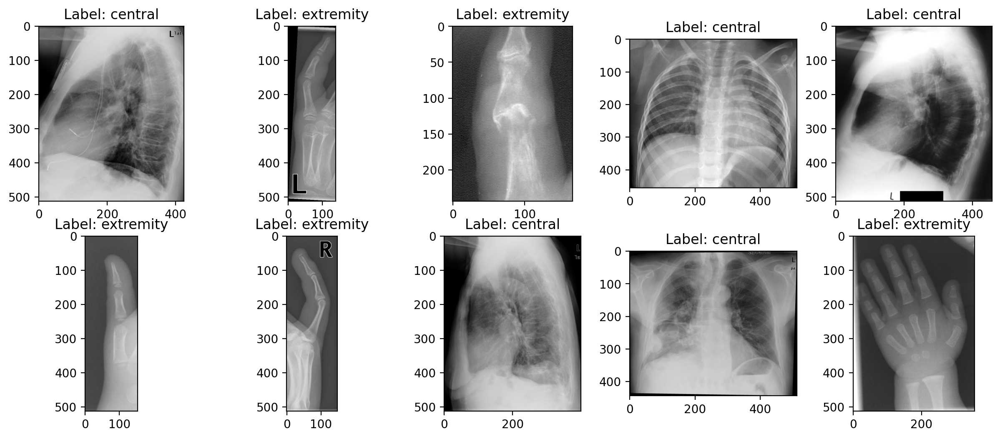

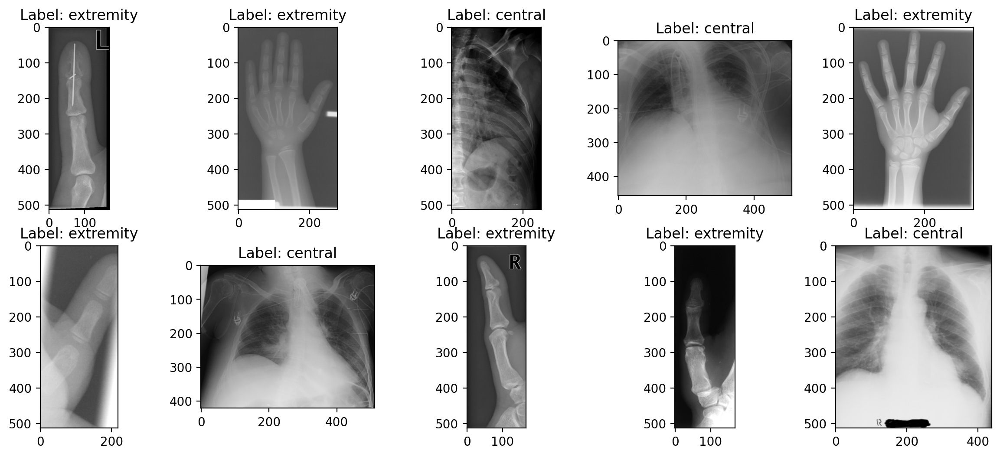

In [ ]:
# Cluster 1
# randomly select 10 indices from the cluster
random_indices = random.sample(list(cluster_indices[0]), 10)

# plot the randomly selected images
fig, axs = plt.subplots(nrows=2, ncols=5, figsize=(15, 6))
axs = axs.ravel()
for i, index in enumerate(random_indices):
    axs[i].imshow(np.array(Image.open(val_set['Path'][index]).convert("RGB"))/255)
    axs[i].set_title(f"Label: {val_set['Central or Extremity'][index]}")
plt.show()

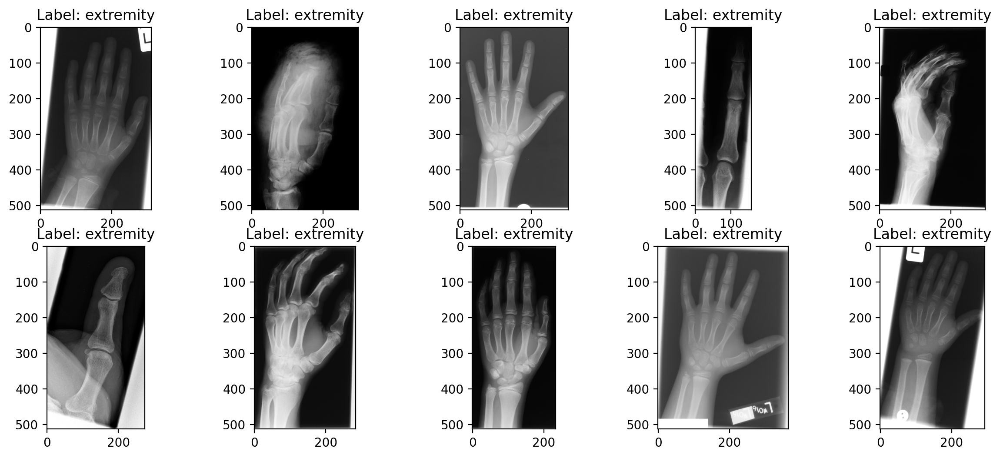

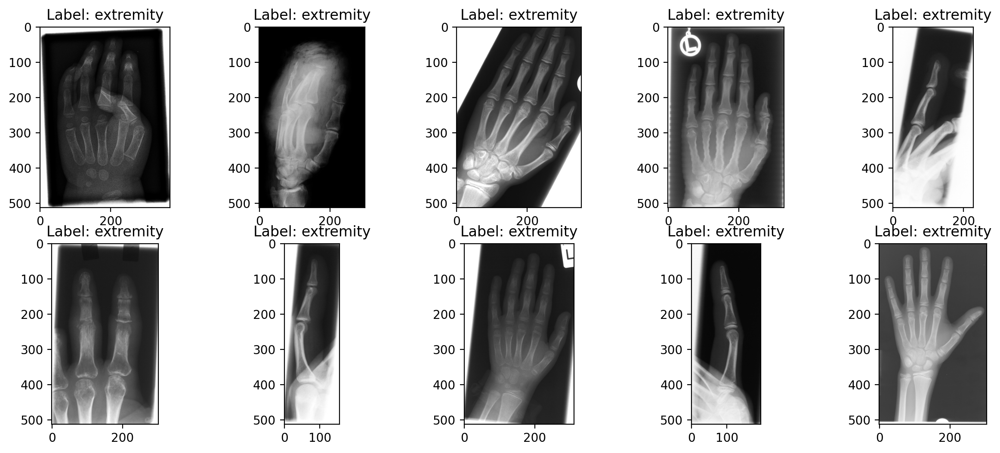

In [ ]:
# Second cluster
# randomly select 10 indices from the cluster
random_indices = random.sample(list(cluster_indices[1]), 10)

# plot the randomly selected images
fig, axs = plt.subplots(nrows=2, ncols=5, figsize=(15, 6))
axs = axs.ravel()
for i, index in enumerate(random_indices):
    axs[i].imshow(np.array(Image.open(val_set['Path'][index]).convert("RGB"))/255)
    axs[i].set_title(f"Label: {val_set['Central or Extremity'][index]}")
plt.show()

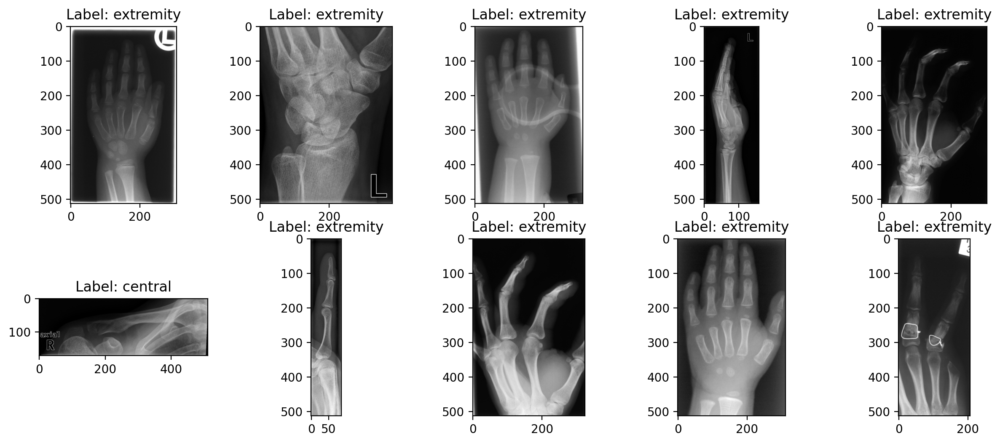

In [ ]:
# Cluster 3

# randomly select 10 indices from the cluster
random_indices = random.sample(list(cluster_indices[2]), 10)

# plot the randomly selected images
fig, axs = plt.subplots(nrows=2, ncols=5, figsize=(15, 6))
axs = axs.ravel()
for i, index in enumerate(random_indices):
    axs[i].imshow(np.array(Image.open(val_set['Path'][index]).convert("RGB"))/255)
    axs[i].set_title(f"Label: {val_set['Central or Extremity'][index]}")
plt.show()

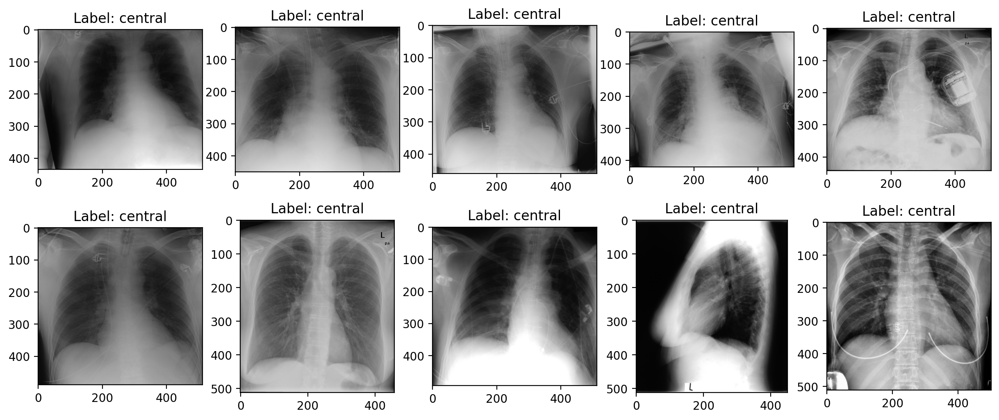

In [ ]:
# Cluster 4

# randomly select 10 indices from the cluster
random_indices = random.sample(list(cluster_indices[3]), 10)

# plot the randomly selected images
fig, axs = plt.subplots(nrows=2, ncols=5, figsize=(15, 6))
axs = axs.ravel()
for i, index in enumerate(random_indices):
    axs[i].imshow(np.array(Image.open(val_set['Path'][index]).convert("RGB"))/255)
    axs[i].set_title(f"Label: {val_set['Central or Extremity'][index]}")
plt.show()

# Fourier-transformed features
This is an example of Fourier-transforming image features, conducting cluster analysis on their features, and training SVMs on the features. This was done after the CNN-extracted features, using the same cross-fold validation sets. This specific example is of the first trial of the 2 body part iteration. This process was repeated with different subsets of the data.

In [ ]:
# Create an empty list to store the extracted features
fft_features = []

start_time = time.time()

for index, row in val_set.iterrows():
    image_path = row['Path']
    features = fft_radial_profile(image_path)
    fft_features.append(features)

end_time = time.time()
elapsed_time = end_time - start_time

print(f"Extracting FFT features took {elapsed_time:.4f} seconds.")

Extracting FFT features took 749.6436 seconds.


In [ ]:
# Convert to numpy array
fft_features_np = np.array(fft_features)

# flatten the array to a 2-dimensional array?
fft_features_flat = fft_features_np.reshape(fft_features_np.shape[0], -1)

In [ ]:
kmeans, principalComponents, cluster_labels = cluster_and_get_labels(fft_features_flat, val_set, n_clusters=4, random_state=299, n_components=10)

In [ ]:
cluster1_indices = np.where(cluster_labels == 0)[0]
cluster2_indices = np.where(cluster_labels == 1)[0]
cluster3_indices = np.where(cluster_labels == 2)[0]
cluster4_indices = np.where(cluster_labels == 3)[0]

print(len(cluster1_indices), len(cluster2_indices), len(cluster3_indices), len(cluster4_indices))

c1_num_label_1 = np.count_nonzero(val_set['Central or Extremity'][cluster1_indices] == 'central')
c1_num_label_0 = np.count_nonzero(val_set['Central or Extremity'][cluster1_indices] == 'extremity')
print(f"Cluster 1: {c1_num_label_1} central vs. {c1_num_label_0} extremity")

c2_num_label_1 = np.count_nonzero(val_set['Central or Extremity'][cluster2_indices] == 'central')
c2_num_label_0 = np.count_nonzero(val_set['Central or Extremity'][cluster2_indices] == 'extremity')
print(f"Cluster 2: {c2_num_label_1} central vs. {c2_num_label_0} extremity")

c3_num_label_1 = np.count_nonzero(val_set['Central or Extremity'][cluster3_indices] == 'central')
c3_num_label_0 = np.count_nonzero(val_set['Central or Extremity'][cluster3_indices] == 'extremity')
print(f"Cluster 3: {c3_num_label_1} central vs. {c3_num_label_0} extremity")

c4_num_label_1 = np.count_nonzero(val_set['Central or Extremity'][cluster4_indices] == 'central')
c4_num_label_0 = np.count_nonzero(val_set['Central or Extremity'][cluster4_indices] == 'extremity')
print(f"Cluster 4: {c4_num_label_1} central vs. {c4_num_label_0} extremity")

180 139 49 136
Cluster 1: 89 central vs. 91 extremity
Cluster 2: 25 central vs. 114 extremity
Cluster 3: 21 central vs. 28 extremity
Cluster 4: 131 central vs. 5 extremity


In [ ]:
analyze_clusters(principalComponents, cluster_labels, kmeans)

Accuracy on the cluster: 0.9333
Accuracy on the cluster: 0.8417
Accuracy on the cluster: 0.8776
Accuracy on the cluster: 0.8750
Mean Accuracy: 0.8819
Standard Deviation: 0.0380
Coefficient of Variation: 4.3058
Silhouette Score: 0.3104
Average Inter-Cluster Distance: 20.93
Intra-Cluster Distances: [10.39  8.22 19.3   8.51]
Average Intra-Cluster Distance: 11.6


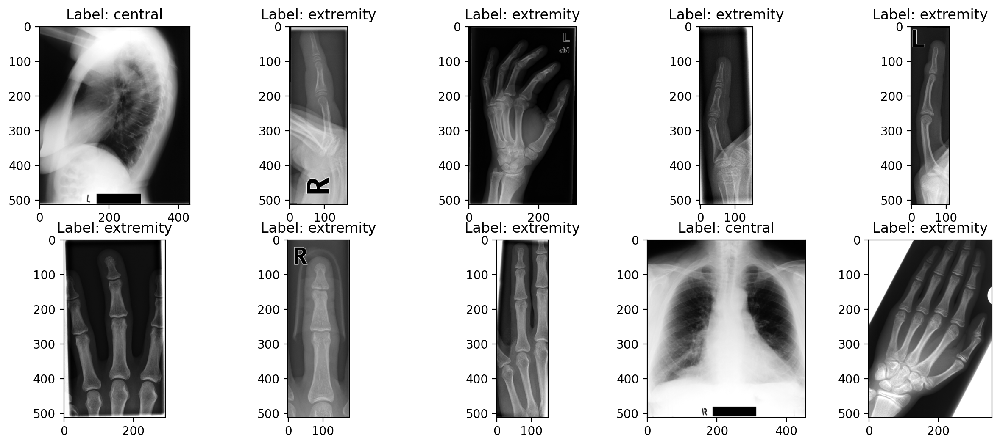

In [ ]:
# Cluster 1

# randomly select 10 indices from the cluster
random_indices = random.sample(list(cluster1_indices), 10)

# plot the randomly selected images
fig, axs = plt.subplots(nrows=2, ncols=5, figsize=(15, 6))
axs = axs.ravel()
for i, index in enumerate(random_indices):
    axs[i].imshow(np.array(Image.open(val_set['Path'][index]).convert("RGB"))/255)
    axs[i].set_title(f"Label: {val_set['Central or Extremity'][index]}")
plt.show()

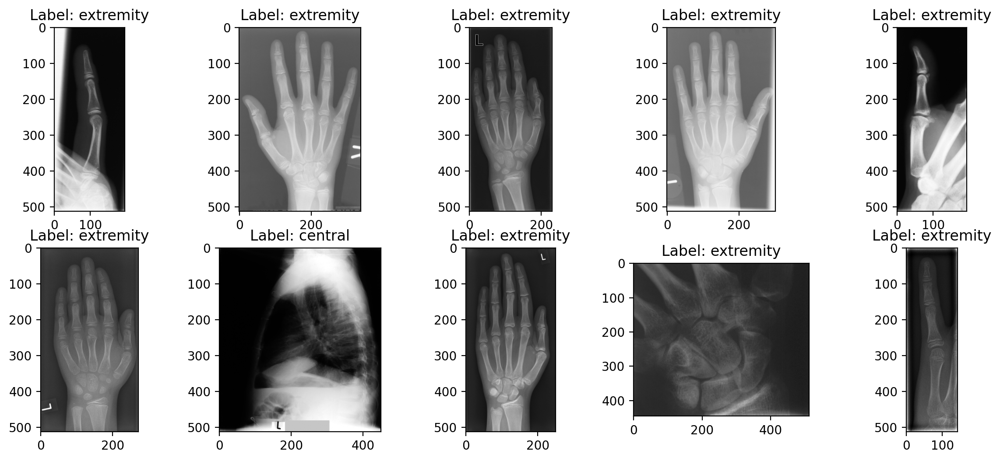

In [ ]:
# Cluster 2

# randomly select 10 indices from the cluster
random_indices = random.sample(list(cluster2_indices), 10)

# plot the randomly selected images
fig, axs = plt.subplots(nrows=2, ncols=5, figsize=(15, 6))
axs = axs.ravel()
for i, index in enumerate(random_indices):
    axs[i].imshow(np.array(Image.open(val_set['Path'][index]).convert("RGB"))/255)
    axs[i].set_title(f"Label: {val_set['Central or Extremity'][index]}")
plt.show()

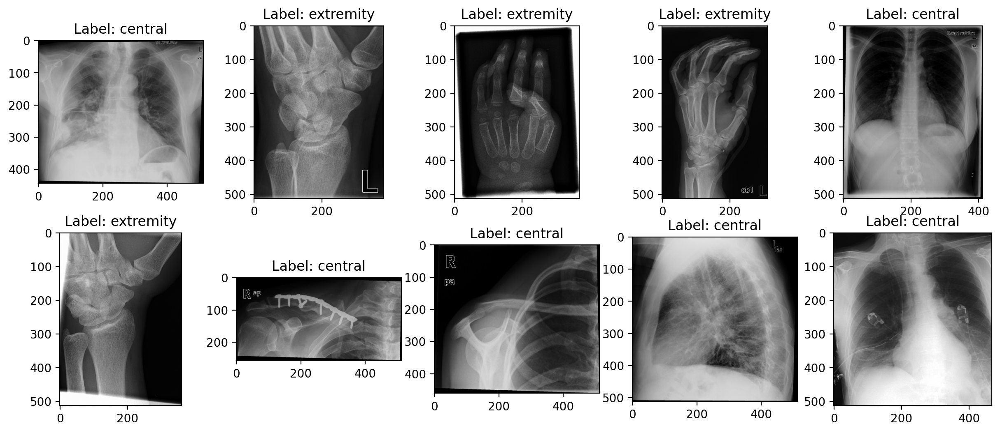

In [ ]:
# Cluster 3

# randomly select 10 indices from the cluster
random_indices = random.sample(list(cluster3_indices), 10)

# plot the randomly selected images
fig, axs = plt.subplots(nrows=2, ncols=5, figsize=(15, 6))
axs = axs.ravel()
for i, index in enumerate(random_indices):
    axs[i].imshow(np.array(Image.open(val_set['Path'][index]).convert("RGB"))/255)
    axs[i].set_title(f"Label: {val_set['Central or Extremity'][index]}")
plt.show()

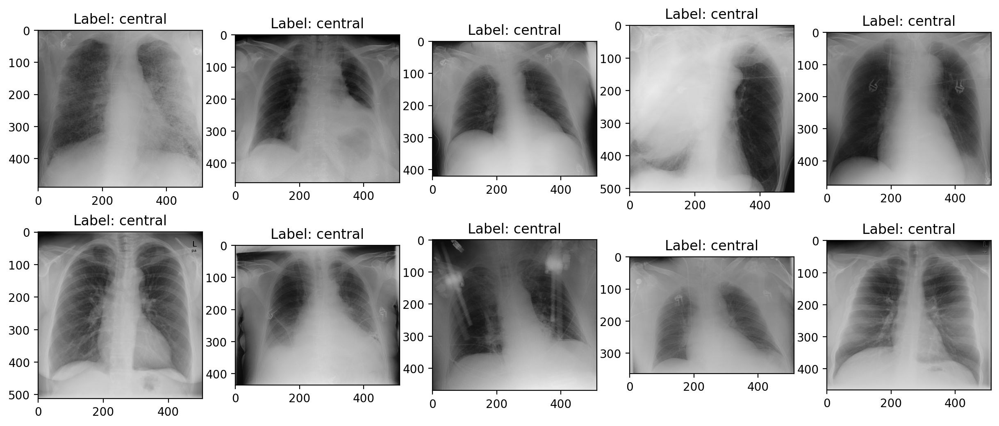

In [ ]:
# Cluster 4

# randomly select 10 indices from the cluster
random_indices = random.sample(list(cluster4_indices), 10)

# plot the randomly selected images
fig, axs = plt.subplots(nrows=2, ncols=5, figsize=(15, 6))
axs = axs.ravel()
for i, index in enumerate(random_indices):
    axs[i].imshow(np.array(Image.open(val_set['Path'][index]).convert("RGB"))/255)
    axs[i].set_title(f"Label: {val_set['Central or Extremity'][index]}")
plt.show()

In [ ]:
X_train = []
start_time = time.time()
for index, row in train_set.iterrows():
    image_path = row['Path']
    try:
        features = fft_radial_profile(image_path)
        X_train.append(features)
    except Exception as e:
        print(f"Error processing image at path {image_path}: {e}")
end_time = time.time()
elapsed_time = end_time - start_time

print(f"Extracting FFT features took {elapsed_time:.4f} seconds.")

y_train = []
for index, row in train_set.iterrows():
    y_train.append(row['Binary Label'])

# X_test = fft_features
X_test = []
for index, row in val_set.iterrows():
    image_path = row['Path']
    features = fft_radial_profile(image_path)
    X_test.append(features)

y_test = []
for index, row in val_set.iterrows():
    y_test.append(row['Binary Label'])

In [ ]:
# Define a range of hyperparameters to search through
param_grid = {
    'C': [0.1, 1, 10],  # Regularization parameter
    'gamma': ['scale', 'auto', 0.1, 1],  # Kernel coefficient
}

# Initialize the SVM classifier with RBF kernel
svm_classifier = SVC(kernel='rbf')

# Perform grid search for hyperparameter optimization
grid_search = GridSearchCV(estimator=svm_classifier, param_grid=param_grid, cv=5)
grid_search.fit(X_train, y_train)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Train the SVM classifier with the best hyperparameters
best_svm_classifier = SVC(kernel='rbf', **best_params)
best_svm_classifier.fit(X_train, y_train)

# Predict labels on the test data
y_pred = svm_classifier.predict(X_test)

# Calculate the accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Sensitivity and specificity
sensitivity = conf_matrix[1, 1] / (conf_matrix[1, 1] + conf_matrix[1, 0])
specificity = conf_matrix[0, 0] / (conf_matrix[0, 0] + conf_matrix[0, 1])

# AUC score
auc_score = roc_auc_score(y_test, y_pred)

print(f"Sensitivity: {sensitivity:.4f}")
print(f"Specificity: {specificity:.4f}")
print(f"AUC Score: {auc_score:.4f}")